# Projeto Airbnb Rio - Ferramenta de Previsão de Preço de Imóvel para pessoas comuns 

### Nosso objetivo

Construir um modelo de previsão de preço que permita uma pessoa comum que possui um imóvel possa saber quanto deve cobrar pela diária do seu imóvel.

Ou ainda, para o locador comum, dado o imóvel que ele está buscando, ajudar a saber se aquele imóvel está com preço atrativo (abaixo da média para imóveis com as mesmas características) ou não.

### O que temos disponível, inspirações e créditos

As bases de dados foram retiradas do site kaggle: https://www.kaggle.com/allanbruno/airbnb-rio-de-janeiro

Você vai perceber semelhanças entre a solução que vamos desenvolver aqui e a dele, mas também algumas diferenças significativas no processo de construção do projeto.

- As bases de dados são os preços dos imóveis obtidos e suas respectivas características em cada mês.
- Os preços são dados em reais (R$)
- Temos bases de abril de 2018 a maio de 2020, com exceção de junho de 2018 que não possui base de dados

### Expectativas Iniciais

- Acredito que a sazonalidade pode ser um fator importante, visto que meses como dezembro costumam ser bem caros no RJ
- A localização do imóvel deve fazer muita diferença no preço, já que no Rio de Janeiro a localização pode mudar completamente as características do lugar (segurança, beleza natural, pontos turísticos)
- Adicionais/Comodidades podem ter um impacto significativo, visto que temos muitos prédios e casas antigos no Rio de Janeiro

Vamos descobrir o quanto esses fatores impactam e se temos outros fatores não tão intuitivos que são extremamente importantes.

### Importar Bibliotecas e Bases de Dados

In [1]:
import pandas as pd
import pathlib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split
import joblib

In [2]:
months = {'jan': 1, 'fev':2, 'mar':3, 'abr': 4, 'mai':5, 'jun': 6, 'jul': 7, 'ago': 8, 'set': 9, 'out': 10, 'nov': 11, 'dez': 12}

path = pathlib.Path('dataset')

base_airbnb = pd.DataFrame()

for file in path.iterdir():
    month_name = file.name[0:3]
    month_number = months[month_name]
    year = int(file.name[-8:-4])
    df = pd.read_csv(path / file.name, low_memory=False)
    df['year'] = year
    df['month'] = month_number
    base_airbnb = pd.concat([base_airbnb, df])
    
display(base_airbnb)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,year,month
0,17878,https://www.airbnb.com/rooms/17878,20191223164813,2019-12-24,Very Nice 2Br - Copacabana - WiFi,Pls note that special rates apply for Carnival...,- large balcony which looks out on pedestrian ...,Pls note that special rates apply for Carnival...,none,This is the best spot in Rio. Everything happe...,...,strict_14_with_grace_period,f,f,1,1.0,0.0,0.0,2.14,2019,12
1,25026,https://www.airbnb.com/rooms/25026,20191223164813,2019-12-24,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,strict_14_with_grace_period,t,t,3,3.0,0.0,0.0,2.03,2019,12
2,31560,https://www.airbnb.com/rooms/31560,20191223164813,2019-12-24,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,strict_14_with_grace_period,f,f,1,1.0,0.0,0.0,2.38,2019,12
3,35636,https://www.airbnb.com/rooms/35636,20191223164813,2019-12-24,Cosy flat close to Ipanema beach,This cosy apartment is just a few steps away ...,"The location is extremely convenient, safe and...",This cosy apartment is just a few steps away ...,none,The apartment street is very quiet and safe ....,...,strict_14_with_grace_period,t,t,1,1.0,0.0,0.0,2.27,2019,12
4,35764,https://www.airbnb.com/rooms/35764,20191223164813,2019-12-24,COPACABANA SEA BREEZE - RIO - 20 X Superhost,Our newly renovated studio is located in the b...,"FEEL LIKE YOUR HOME LIVING AS ""CARIOCA"" LOCAL ...",Our newly renovated studio is located in the b...,none,Our guests will experience living with a local...,...,strict_14_with_grace_period,f,t,1,1.0,0.0,0.0,2.85,2019,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37240,356406,https://www.airbnb.com/rooms/356406,20180914022056,2018-09-14,Luxurious apartment in Copacabana,NaN,Apartment between Copacabana and Ipanema. I ha...,Apartment between Copacabana and Ipanema. I ha...,none,NaN,...,strict_14_with_grace_period,f,f,4,NaN,NaN,NaN,0.07,2018,9
37241,10677877,https://www.airbnb.com/rooms/10677877,20180914022056,2018-09-14,604 Studio Copacabana,"Apartamento todo reformado. Possui wi fi, TV a...",NaN,"Apartamento todo reformado. Possui wi fi, TV a...",none,NaN,...,strict_14_with_grace_period,f,f,4,NaN,NaN,NaN,NaN,2018,9
37242,27831574,https://www.airbnb.com/rooms/27831574,20180914022056,2018-09-14,2 BRs & 2 WC's,NaN,NaN,NaN,none,NaN,...,strict_14_with_grace_period,f,f,1,NaN,NaN,NaN,NaN,2018,9
37243,2066453,https://www.airbnb.com/rooms/2066453,20180914022056,2018-09-14,Charming Studio in Copacabana,Well located within a short stroll from the be...,Bedroom divided by sliding door from dining ro...,Well located within a short stroll from the be...,none,NaN,...,moderate,f,f,1,NaN,NaN,NaN,0.06,2018,9


### Consolidar Base de Dados

Limpeza de colunas para melhorar performance e análise
retirar id, listinf e informações irerelevantes
coluns repetidas ou informações duplicadas (datas)
colunas preenchidas com texto livre (não haverá analise por palavras soltas)
colunas todos ou maioria dos valores iguais

In [3]:
base_airbnb.head(1000).to_csv('first_registers.csv')

### Se tivermos muitas colunas, já vamos identificar quais colunas podemos excluir

#### Como há muitas colunas, .csv foi passado para excel para analisar individualmente as colunas idenficando quais seriam possíveis excluir. Analisando quantidade de valores nulos e se a coluna tem informação que poderia alterar o preço

In [4]:
print((base_airbnb['host_total_listings_count'] == base_airbnb['host_listings_count']).value_counts())

True     901750
False       460
dtype: int64


In [5]:
print(base_airbnb['square_feet'].isnull().sum())

888162


In [6]:
columns = ['host_response_time','host_response_rate','host_is_superhost','host_listings_count','latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms','beds','bed_type','amenities','price','security_deposit','cleaning_fee','guests_included','extra_people','minimum_nights','maximum_nights','number_of_reviews','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','instant_bookable','is_business_travel_ready','cancellation_policy','year','month']

base_airbnb = base_airbnb.loc[:, columns]
display(base_airbnb)

,host_response_time,host_response_rate,host_is_superhost,host_listings_count,latitude,longitude,property_type,room_type,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,year,month
0,within an hour,100%,t,2.0,-22.965920,-43.178960,Condominium,Entire home/apt,5,1.0,...,10.0,10.0,10.0,10.0,9.0,t,f,strict_14_with_grace_period,2019,12
1,within a day,91%,f,3.0,-22.977120,-43.190450,Apartment,Entire home/apt,2,1.0,...,10.0,9.0,10.0,10.0,9.0,f,f,strict_14_with_grace_period,2019,12
2,within an hour,100%,t,1.0,-22.983020,-43.214270,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,10.0,t,f,strict_14_with_grace_period,2019,12
3,within an hour,100%,t,1.0,-22.988160,-43.193590,Apartment,Entire home/apt,2,1.5,...,9.0,10.0,10.0,10.0,9.0,f,f,strict_14_with_grace_period,2019,12
4,within an hour,100%,t,1.0,-22.981270,-43.190460,Loft,Entire home/apt,2,1.0,...,10.0,10.0,10.0,10.0,10.0,f,f,strict_14_with_grace_period,2019,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37240,within a day,100%,f,4.0,-22.983058,-43.192096,Apartment,Entire home/apt,6,2.0,...,9.0,10.0,10.0,10.0,9.0,f,f,strict_14_with_grace_period,2018,9
37241,within a day,67%,f,4.0,-22.983713,-43.192103,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2018,9
37242,within an hour,100%,f,1.0,-22.982379,-43.192925,Apartment,Entire home/apt,1,2.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2018,9
37243,within a day,50%,f,1.0,-22.976690,-43.193082,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,10.0,f,f,moderate,2018,9


### Tratar Valores Faltando

#### Linhas com valores nulos serão excluídas

In [7]:
for column in base_airbnb:
    if base_airbnb[column].isnull().sum() > 300000:
        base_airbnb = base_airbnb.drop(column, axis=1)
        
print(base_airbnb.isnull().sum())

host_is_superhost            460
host_listings_count          460
latitude                       0
longitude                      0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                   1724
bedrooms                     850
beds                        2502
bed_type                       0
amenities                      0
price                          0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
number_of_reviews              0
instant_bookable               0
is_business_travel_ready       0
cancellation_policy            0
year                           0
month                          0
dtype: int64


In [8]:
print(base_airbnb.shape)

(902210, 23)


In [9]:
base_airbnb = base_airbnb.dropna()

print(base_airbnb.shape)

(897709, 23)


In [10]:
print(base_airbnb.isnull().sum())

host_is_superhost           0
host_listings_count         0
latitude                    0
longitude                   0
property_type               0
room_type                   0
accommodates                0
bathrooms                   0
bedrooms                    0
beds                        0
bed_type                    0
amenities                   0
price                       0
guests_included             0
extra_people                0
minimum_nights              0
maximum_nights              0
number_of_reviews           0
instant_bookable            0
is_business_travel_ready    0
cancellation_policy         0
year                        0
month                       0
dtype: int64


### Verificar Tipos de Dados em cada coluna

In [11]:
print(base_airbnb.dtypes)
print('--'*20)
print(base_airbnb.iloc[0])

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
year                          int64
month                         int64
dtype: object
----------------------------------------
host_is_superhost                                                           t
host_listings_count                    

#### Price and Extra people como float e não obj

In [12]:
base_airbnb['price'] = base_airbnb['price'].str.replace('$', '')
base_airbnb['price'] = base_airbnb['price'].str.replace(',', '')
base_airbnb['price'] = base_airbnb['price'].astype(np.float32, copy=False)

print(base_airbnb['price'])

base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace('$', '')
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace(',', '')
base_airbnb['extra_people'] = base_airbnb['extra_people'].astype(np.float32, copy=False)


print(base_airbnb['extra_people'])

/tmp/ipykernel_28405/3028744507.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  base_airbnb['price'] = base_airbnb['price'].str.replace('$', '')


0        323.0
1        159.0
2        266.0
3        368.0
4        131.0
         ...  
37240    455.0
37241    401.0
37242    200.0
37243    196.0
37244    159.0
Name: price, Length: 897709, dtype: float32


/tmp/ipykernel_28405/3028744507.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace('$', '')


0        61.0
1        45.0
2        41.0
3        61.0
4        80.0
         ... 
37240    52.0
37241     0.0
37242    30.0
37243     0.0
37244     0.0
Name: extra_people, Length: 897709, dtype: float32


In [13]:
display(base_airbnb.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 897709 entries, 0 to 37244
Data columns (total 23 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   host_is_superhost         897709 non-null  object 
 1   host_listings_count       897709 non-null  float64
 2   latitude                  897709 non-null  float64
 3   longitude                 897709 non-null  float64
 4   property_type             897709 non-null  object 
 5   room_type                 897709 non-null  object 
 6   accommodates              897709 non-null  int64  
 7   bathrooms                 897709 non-null  float64
 8   bedrooms                  897709 non-null  float64
 9   beds                      897709 non-null  float64
 10  bed_type                  897709 non-null  object 
 11  amenities                 897709 non-null  object 
 12  price                     897709 non-null  float32
 13  guests_included           897709 non-null  in

None

### Análise Exploratória e Tratar Outliers

### Gráfico correlação

<AxesSubplot:>

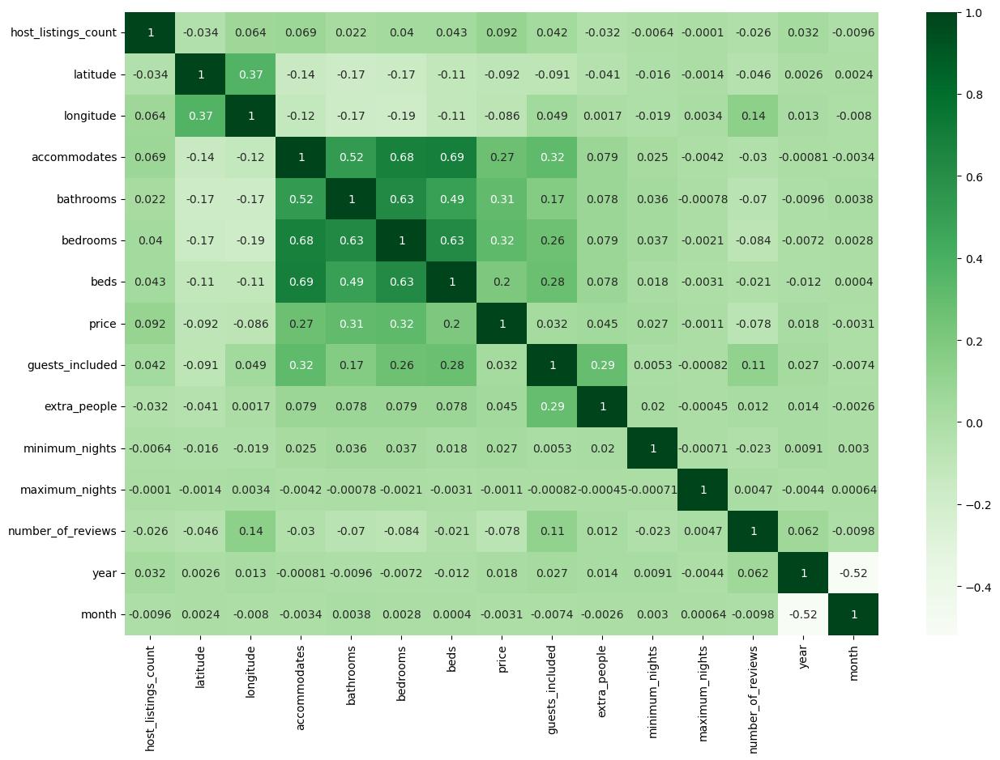

In [14]:
# print(base_airbnb.corr())
plt.figure(figsize=(15,10))
sns.heatmap(base_airbnb.corr(), annot=True, cmap='Greens')

#### A seguir, serão excluídos os valores que são outliers em nossa análise

In [15]:
#Análise de Outliers
def limits(column):
    q1 = column.quantile(0.25)
    q3 = column.quantile(0.75)
    ampl = q3 - q1
    return (q1-1.5*ampl, q3+1.5*ampl)

def delete_outliers(df, column):
    lines = df.shape[0]
    inf, sup = limits(df[column]) 
    df = df.loc[(df[column] >= inf) & (df[column] <= sup), :]
    removed_lines = lines - df.shape[0] 
    return df, removed_lines

In [16]:
def box_diagram(column):
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_size_inches(15,5)
    sns.boxplot(x=column, ax=ax1)
    ax2.set_xlim(limits(column))
    sns.boxplot(x=column, ax=ax2)
    
def column_histogram(column):
    plt.figure(figsize=(15,5))
    sns.distplot(column, hist=True)
    
def bar_graph(column):
    plt.figure(figsize=(15,5))
    ax = sns.barplot(x=column.value_counts().index, y=column.value_counts())
    ax.set_xlim(limits(column)) 

### price

/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


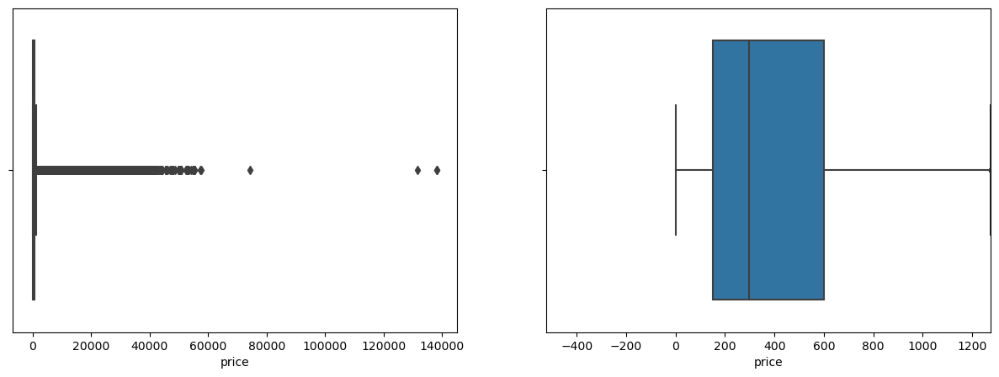

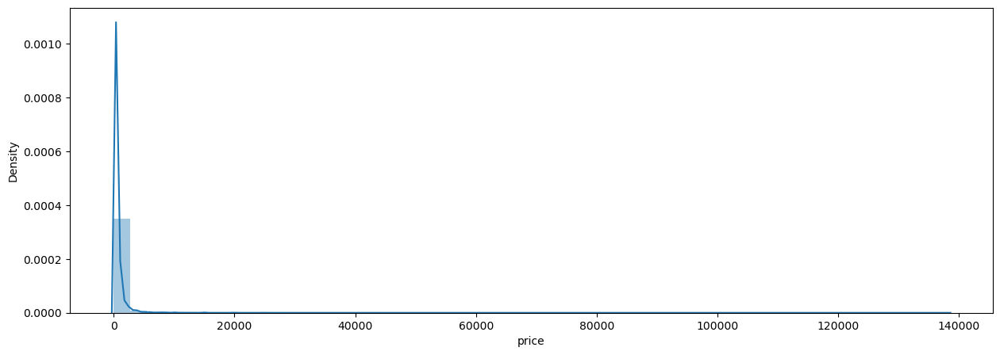

In [17]:
box_diagram(base_airbnb['price'])
column_histogram(base_airbnb['price'])

Como estamos contruindo um modelo para imóveis comuns, acredamos que que os valores acima do limite superior serão apenas de apartamento de luxo, que não é o objetico principal. Por isso, 

In [18]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'price')
print(f'{removed_lines} linhas removidas')

87282 linhas removidas


/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


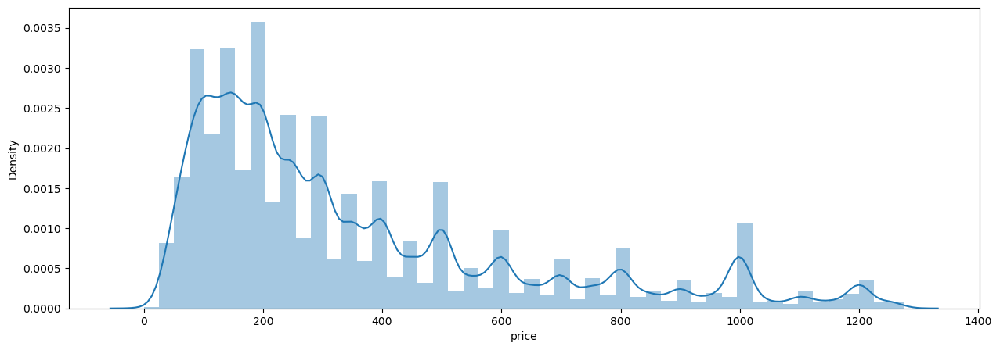

In [19]:
column_histogram(base_airbnb['price'])

### extra_people

/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


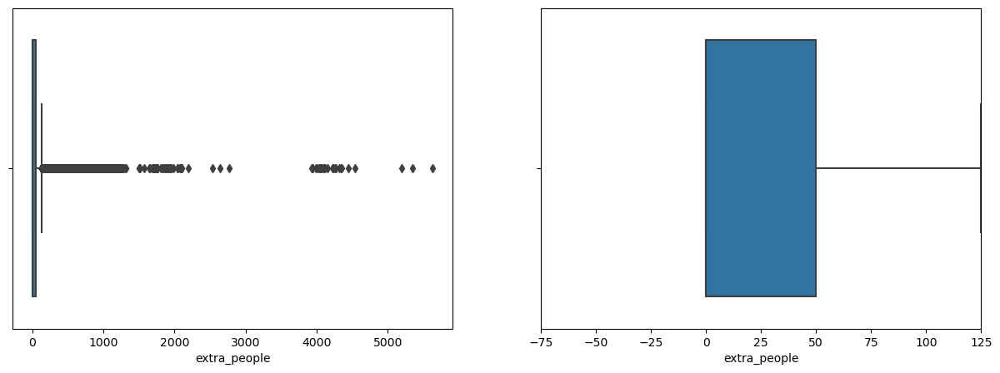

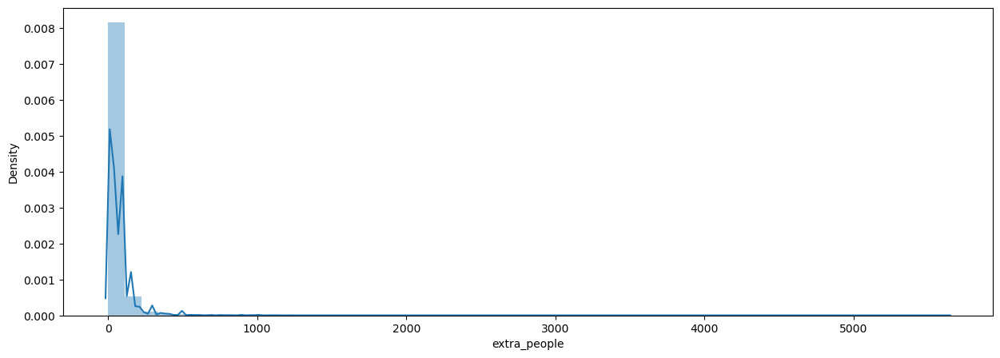

In [20]:
box_diagram(base_airbnb['extra_people'])
column_histogram(base_airbnb['extra_people'])

In [21]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'extra_people')
print(f'{removed_lines} linhas removidas')

59194 linhas removidas


### hosting_listing_counts

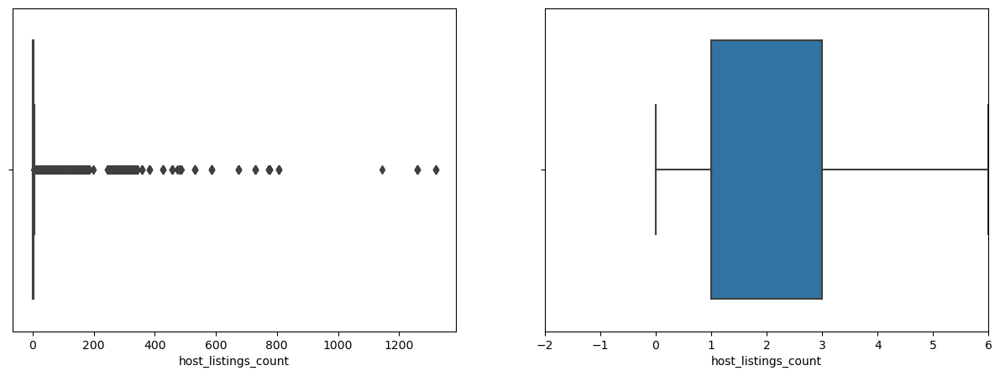

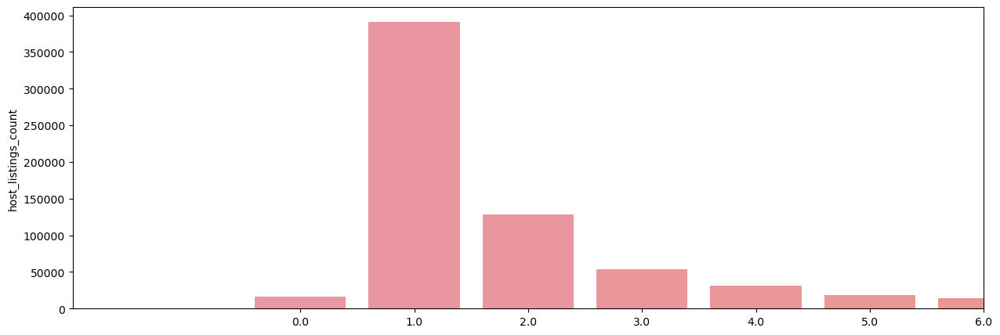

In [22]:
box_diagram(base_airbnb['host_listings_count'])
bar_graph(base_airbnb['host_listings_count'])

Podemos excluir os outliers, já que no objetivo do nosso projeto, hosts com mais de 6 propriedades não é o úblico alvo do projeto. Devem ser imobiliarias ou profissionais que trabalham com isso

In [23]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'host_listings_count')
print(f'{removed_lines} linhas removidas')

97723 linhas removidas


### accommodates

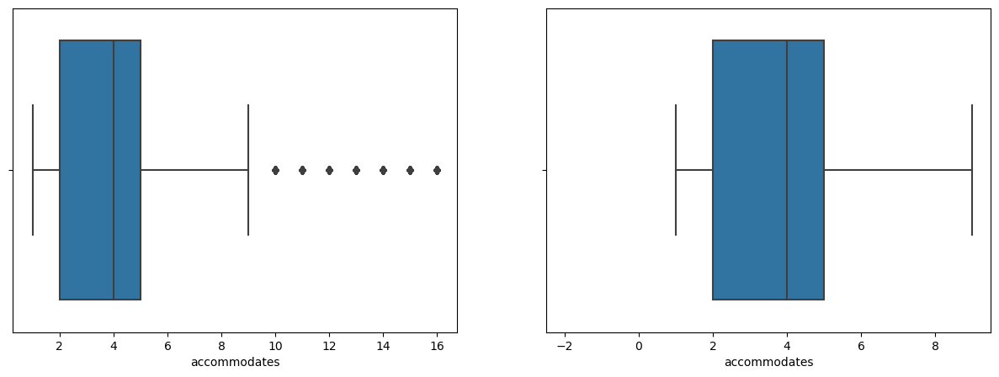

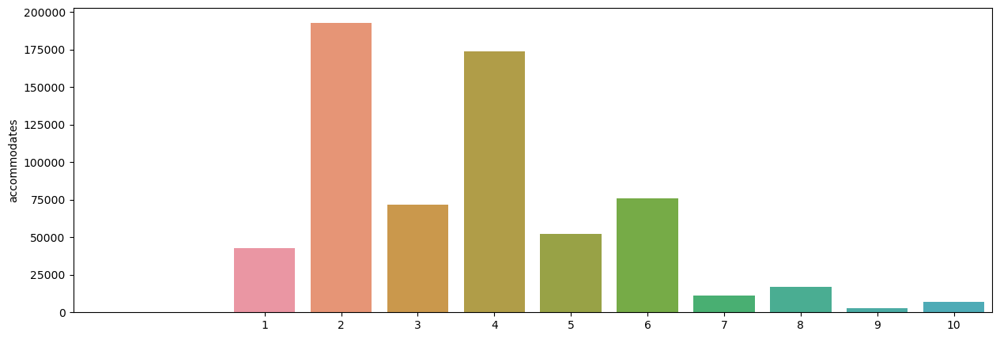

In [24]:
box_diagram(base_airbnb['accommodates'])
bar_graph(base_airbnb['accommodates'])

In [25]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'accommodates')
print(f'{removed_lines} linhas removidas')

13146 linhas removidas


### bathrooms

<AxesSubplot:ylabel='bathrooms'>

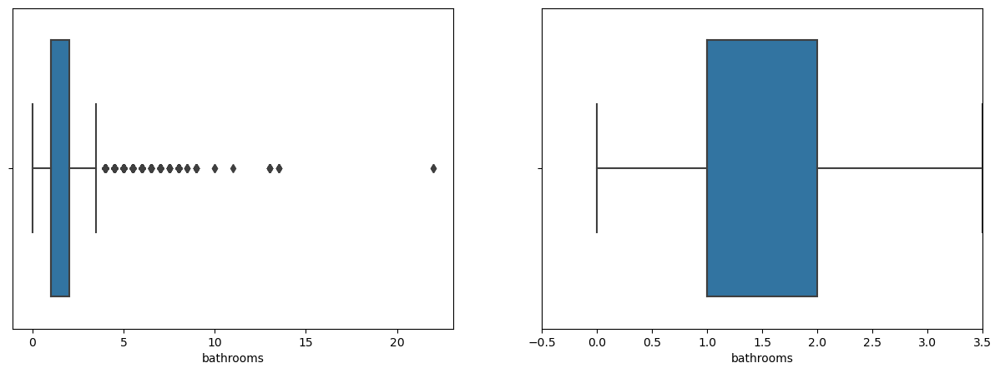

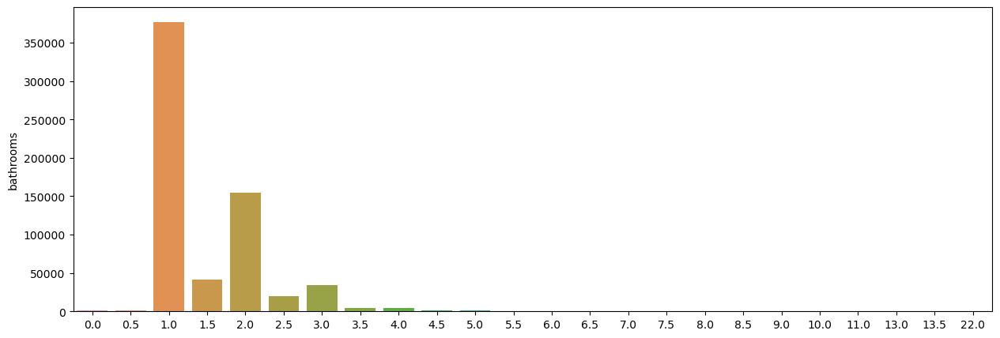

In [26]:
box_diagram(base_airbnb['bathrooms'])
plt.figure(figsize=(15,5))
sns.barplot(x=base_airbnb['bathrooms'].value_counts().index, y=base_airbnb['bathrooms'].value_counts())

In [27]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'bathrooms')
print(f'{removed_lines} linhas removidas')

6894 linhas removidas


### bedrooms

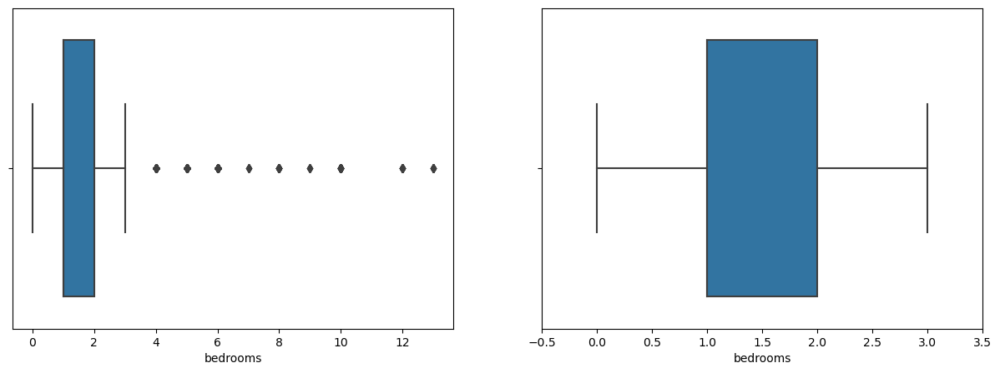

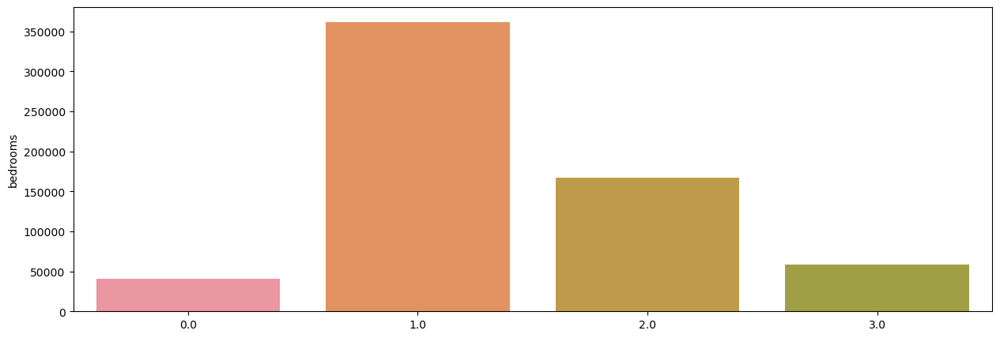

In [28]:
box_diagram(base_airbnb['bedrooms'])
bar_graph(base_airbnb['bedrooms'])

In [29]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'bedrooms')
print(f'{removed_lines} linhas removidas')

5482 linhas removidas


### beds

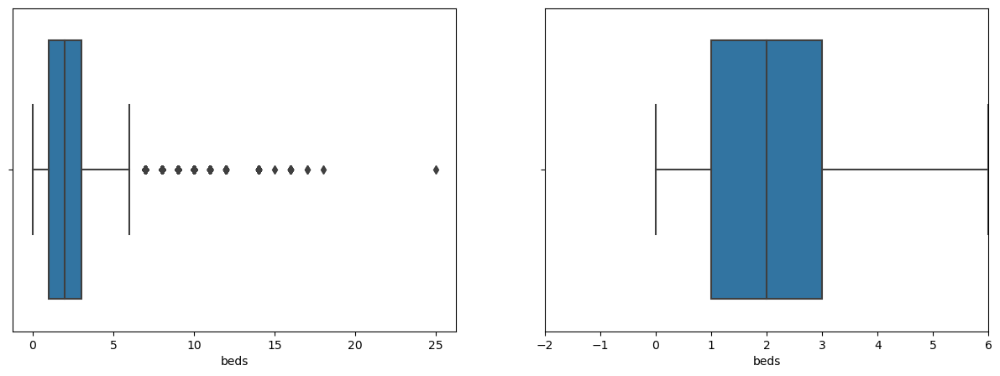

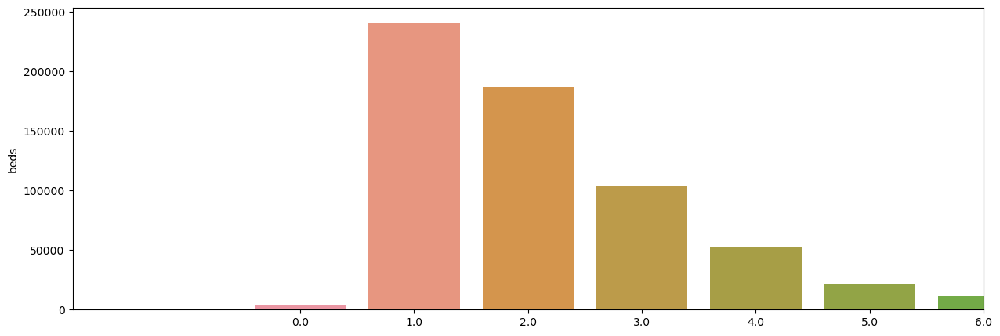

In [30]:
box_diagram(base_airbnb['beds'])
bar_graph(base_airbnb['beds'])

In [31]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'beds')
print(f'{removed_lines} linhas removidas')

5622 linhas removidas


### guests_included

(1.0, 1.0)


/tmp/ipykernel_28405/2429090455.py:5: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax2.set_xlim(limits(column))
/tmp/ipykernel_28405/2429090455.py:15: UserWarning: Attempting to set identical left == right == 1.0 results in singular transformations; automatically expanding.
  ax.set_xlim(limits(column))


<AxesSubplot:ylabel='guests_included'>

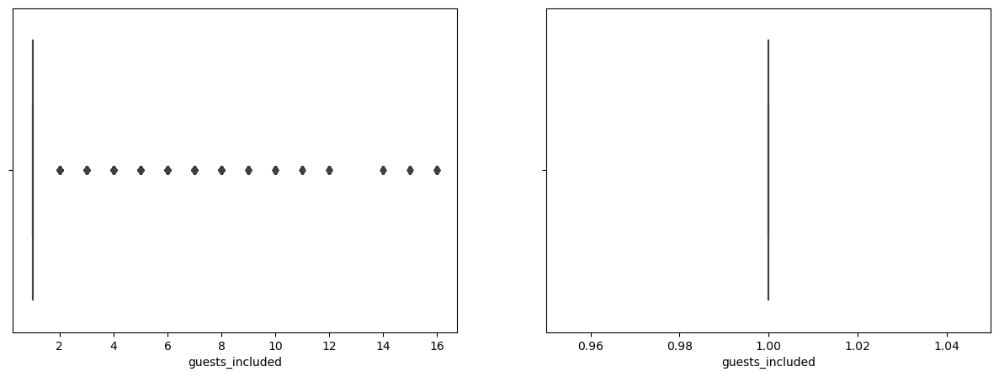

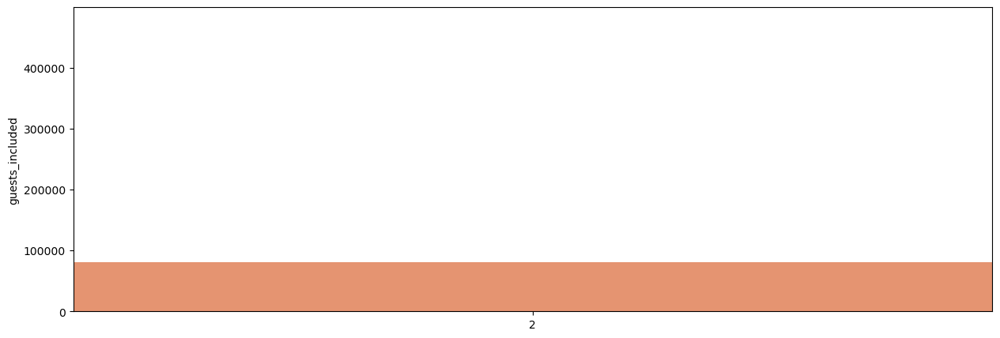

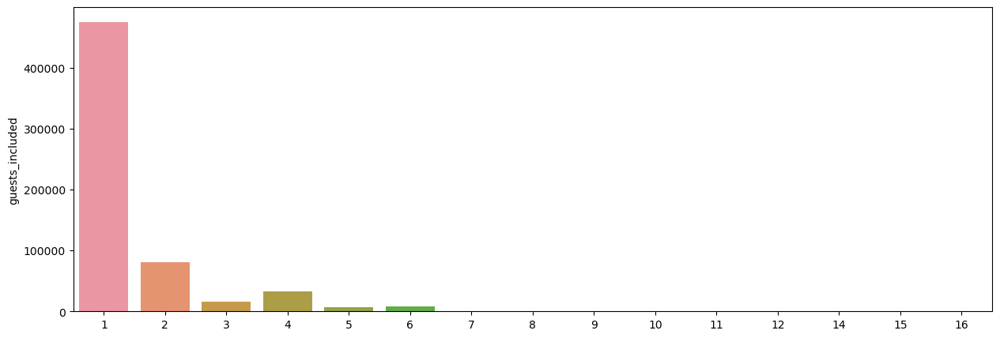

In [32]:
box_diagram(base_airbnb['guests_included'])
bar_graph(base_airbnb['guests_included'])
print(limits(base_airbnb['guests_included']))
plt.figure(figsize=(15,5))
sns.barplot(x=base_airbnb['guests_included'].value_counts().index, y=base_airbnb['guests_included'].value_counts())

Remover essa coluna da análise, pois esse valor parece n~ao ter relevancia no cadastro do air_bnb

In [33]:
base_airbnb = base_airbnb.drop('guests_included', axis=1)
base_airbnb.shape

(622366, 22)

### minimum_nights

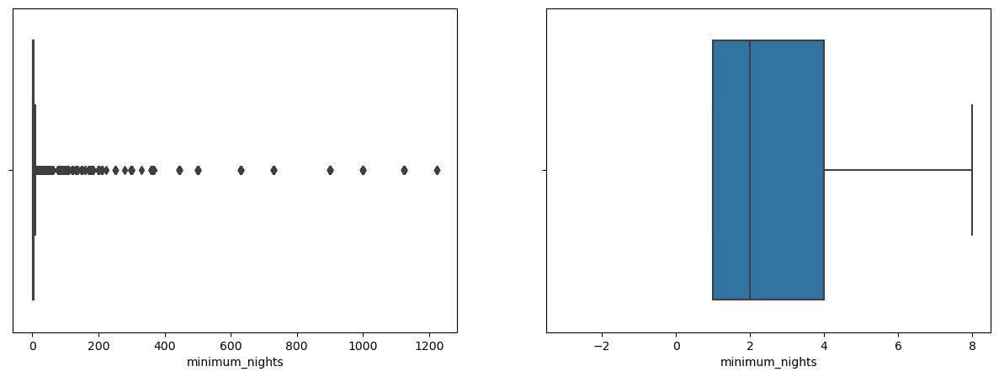

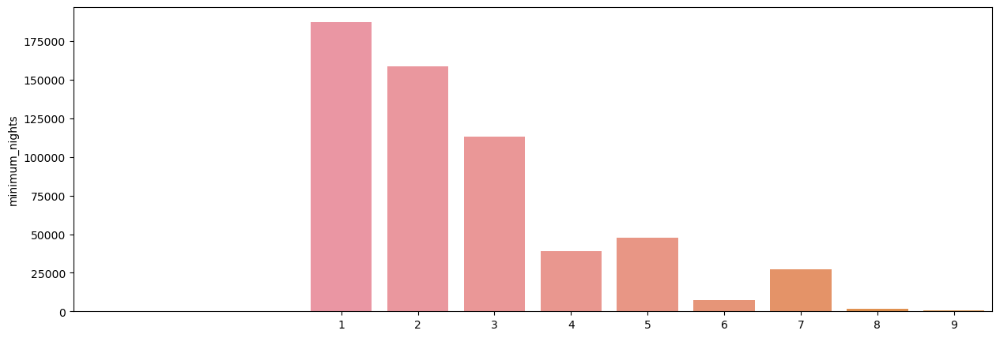

In [34]:
box_diagram(base_airbnb['minimum_nights'])
bar_graph(base_airbnb['minimum_nights'])

In [35]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'minimum_nights')
print(f'{removed_lines} linhas removidas')

40383 linhas removidas


### maximum_nigths

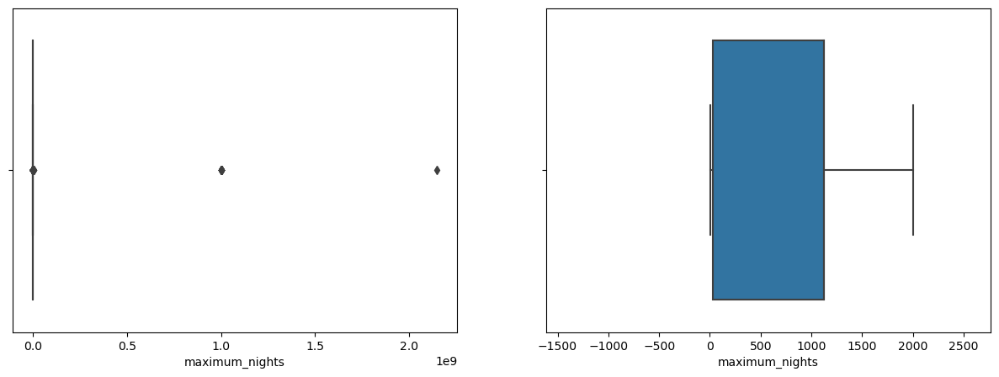

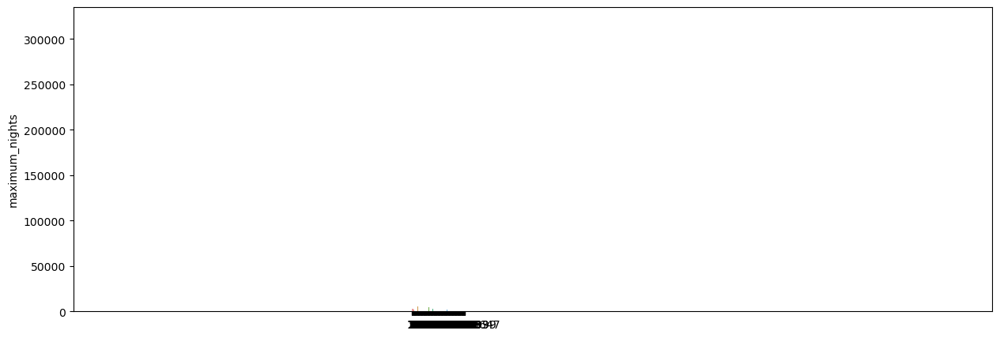

In [36]:
box_diagram(base_airbnb['maximum_nights'])
bar_graph(base_airbnb['maximum_nights'])

Analisando, não faz muito sentindo manter esse valor

In [37]:
base_airbnb = base_airbnb.drop('maximum_nights', axis=1)
base_airbnb.shape

(581983, 21)

### number_of_reviews

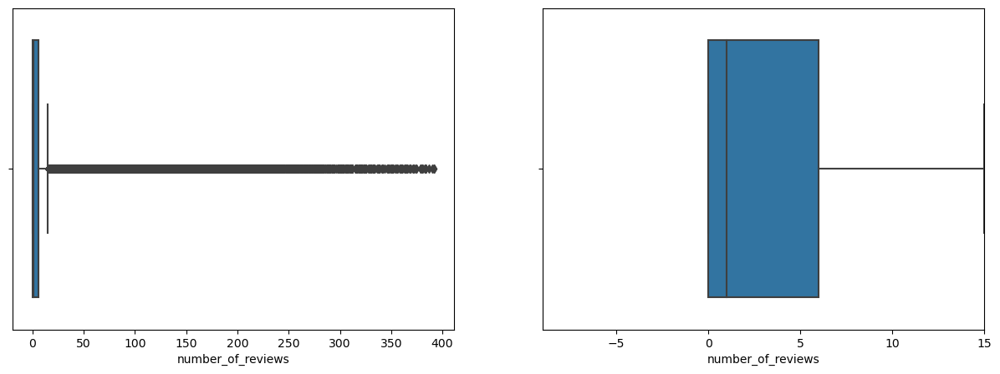

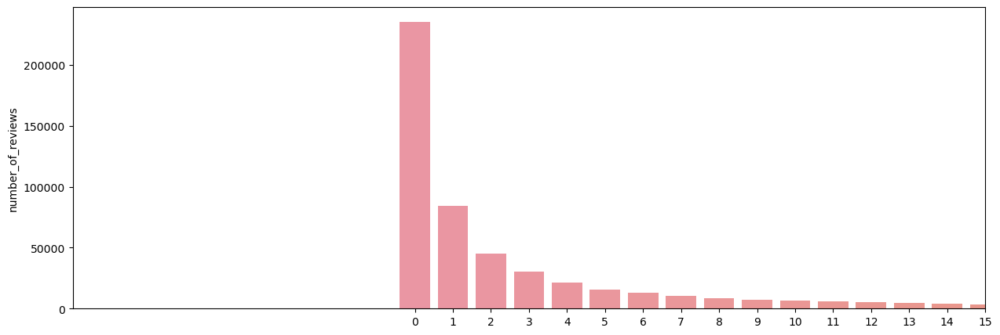

In [38]:
box_diagram(base_airbnb['number_of_reviews'])
bar_graph(base_airbnb['number_of_reviews'])

Analisando esse dado, não parece fazer sentido tirar limites superiores, onde seriam imveis com muitos reviews. Porem, analisando, seria interessante, manter um modelo que não tem relevÂncia a quantidade de reviews para analise do imovel

In [39]:
base_airbnb = base_airbnb.drop('number_of_reviews', axis=1)
base_airbnb.shape

(581983, 20)

### tratamento de colunas de texto

#### property_type

Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                      34
Resort    

/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


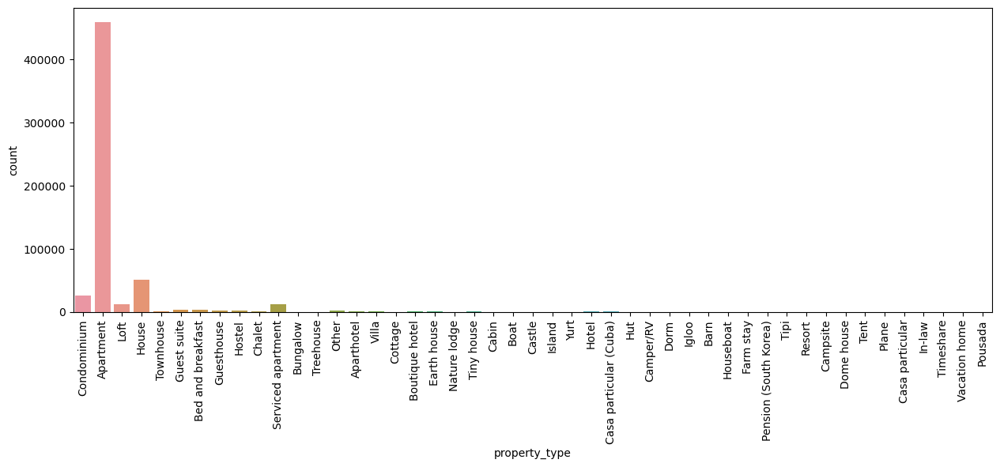

In [40]:
print(base_airbnb['property_type'].value_counts())

plt.figure(figsize=(15,5))
graph = sns.countplot('property_type', data=base_airbnb)
graph.tick_params(axis='x', rotation=90)

Apartment             458354
House                  51387
Condominium            26456
Serviced apartment     12671
Loft                   12352
Other                   8850
Guest suite             3621
Bed and breakfast       3472
Hostel                  2665
Guesthouse              2155
Name: property_type, dtype: int64


/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


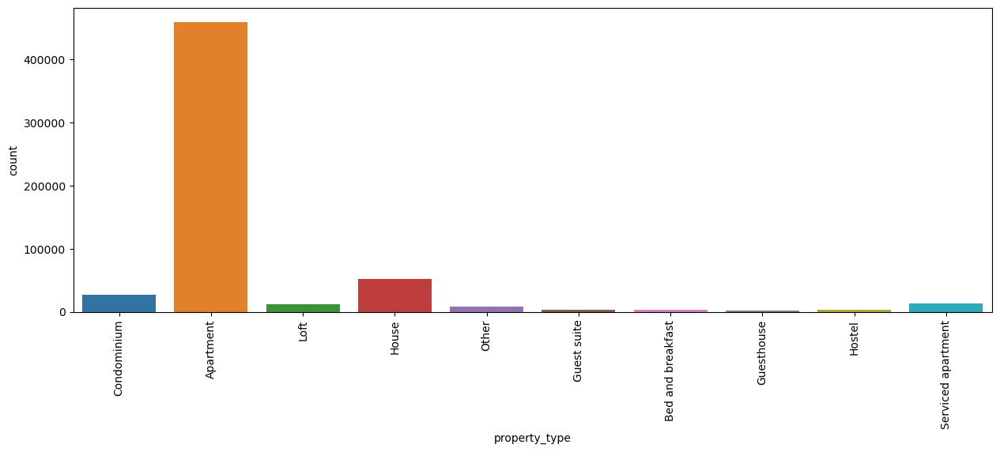

In [41]:
types_house = base_airbnb['property_type'].value_counts()
for t in types_house.index:
    if types_house[t]<2000:
        base_airbnb.loc[base_airbnb['property_type']==t,'property_type'] = 'Other'
        
print(base_airbnb['property_type'].value_counts())
plt.figure(figsize=(15,5))
graph = sns.countplot('property_type', data=base_airbnb)
graph.tick_params(axis='x', rotation=90)

## room_type

Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: room_type, dtype: int64


/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


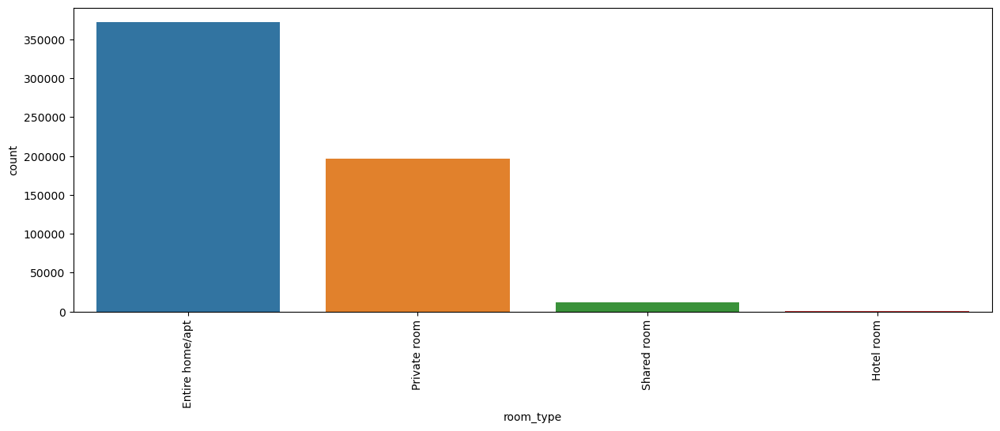

In [42]:
print(base_airbnb['room_type'].value_counts())

plt.figure(figsize=(15,5))
graph = sns.countplot('room_type', data=base_airbnb)
graph.tick_params(axis='x', rotation=90)

## bed_type

Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: bed_type, dtype: int64


/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


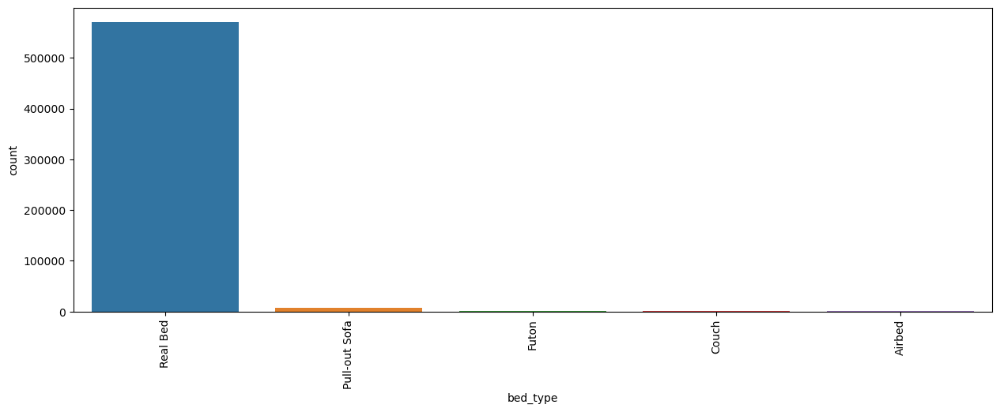

In [43]:
print(base_airbnb['bed_type'].value_counts())

plt.figure(figsize=(15,5))
graph = sns.countplot('bed_type', data=base_airbnb)
graph.tick_params(axis='x', rotation=90)

Real Bed    570643
Others       11340
Name: bed_type, dtype: int64


/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


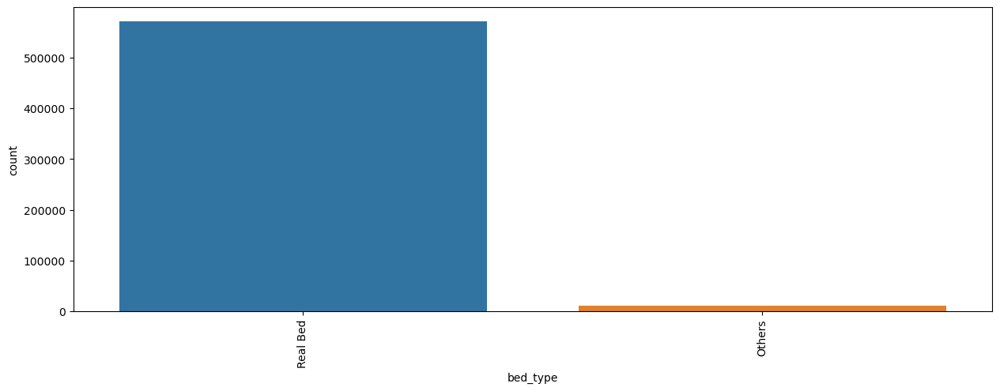

In [44]:
#agrupando bed_types

types_bed = base_airbnb['bed_type'].value_counts()
for t in types_bed.index:
    if types_bed[t]<10000:
        base_airbnb.loc[base_airbnb['bed_type']==t,'bed_type'] = 'Others'
        
print(base_airbnb['bed_type'].value_counts())
plt.figure(figsize=(15,5))
graph = sns.countplot('bed_type', data=base_airbnb)
graph.tick_params(axis='x', rotation=90)

## cancellation_policy

flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: cancellation_policy, dtype: int64


/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


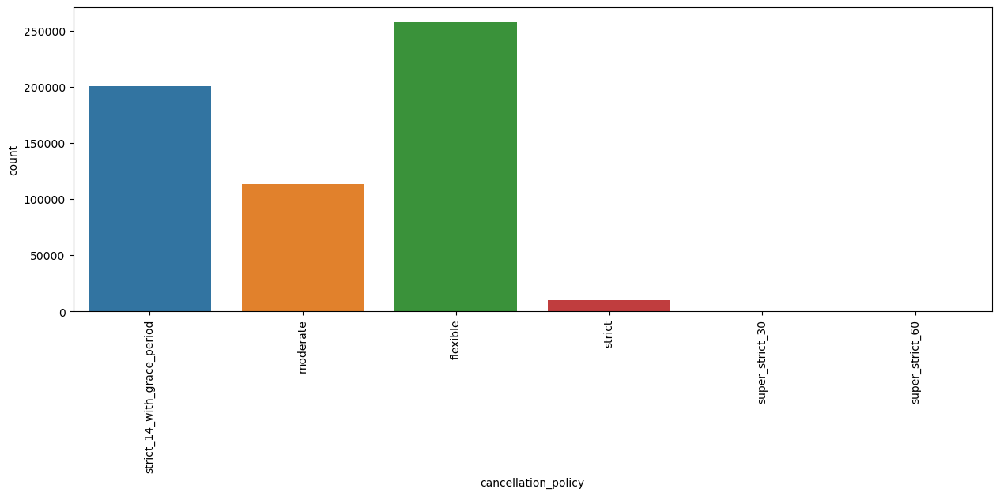

In [45]:
print(base_airbnb['cancellation_policy'].value_counts())

plt.figure(figsize=(15,5))
graph = sns.countplot('cancellation_policy', data=base_airbnb)
graph.tick_params(axis='x', rotation=90)

flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9863
Name: cancellation_policy, dtype: int64


/home/caiogiffoni/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


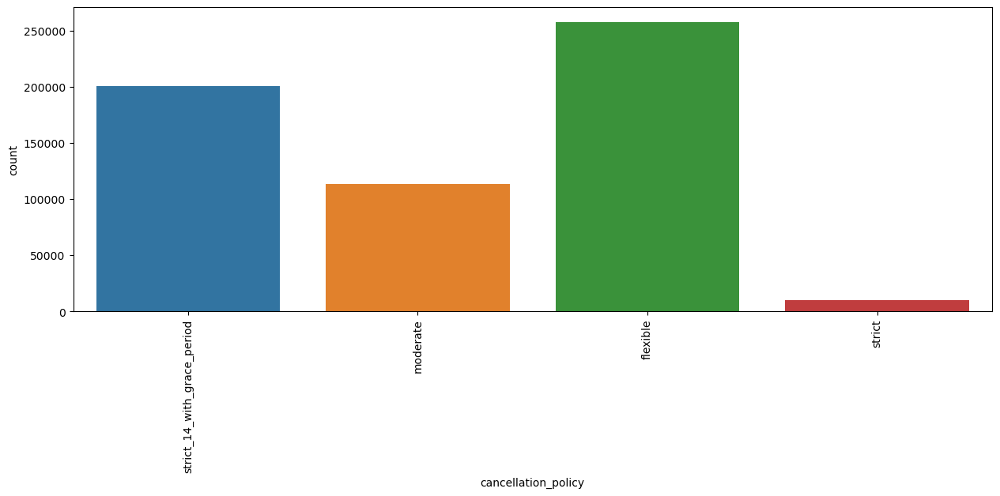

In [46]:
# agrupando

types_cancellation = base_airbnb['cancellation_policy'].value_counts()
for t in types_cancellation.index:
    if types_cancellation[t]<10000:
        base_airbnb.loc[base_airbnb['cancellation_policy']==t,'cancellation_policy'] = 'strict'
        
print(base_airbnb['cancellation_policy'].value_counts())
plt.figure(figsize=(15,5))
graph = sns.countplot('cancellation_policy', data=base_airbnb)
graph.tick_params(axis='x', rotation=90)

## amenities

In [47]:
print(len(base_airbnb['amenities'].iloc[0].split(',')))
base_airbnb['amenities'] = base_airbnb['amenities'].apply(lambda x: len(x.split(',')))

print(base_airbnb['amenities'])

33
0        33
1        14
2        25
3        34
4        41
         ..
37238    20
37239    11
37240    11
37241     8
37243    15
Name: amenities, Length: 581983, dtype: int64


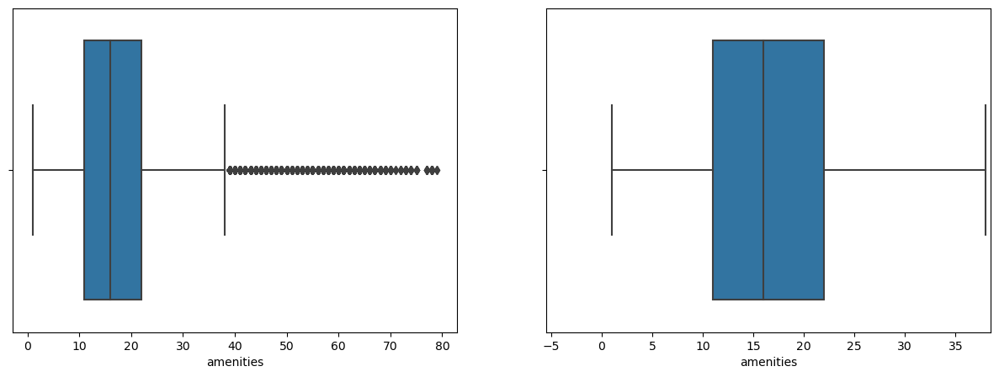

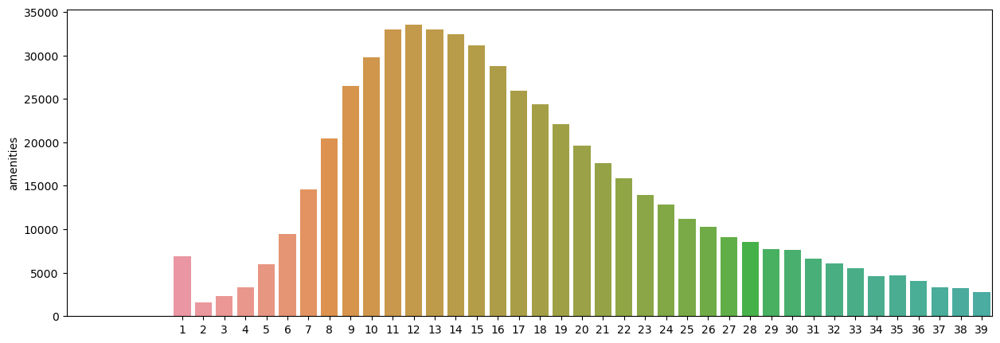

In [48]:
box_diagram(base_airbnb['amenities'])
bar_graph(base_airbnb['amenities'])

In [49]:
base_airbnb, removed_lines = delete_outliers(base_airbnb, 'amenities')
print(f'{removed_lines} linhas removidas')

24343 linhas removidas


### Visualização de mapa

In [50]:
sample_map = base_airbnb.sample(n=50000)

map_center = {'lat': sample_map.latitude.mean(), 'lon': sample_map.longitude.mean()}

map_prices = px.density_mapbox(sample_map, lat='latitude', lon='longitude', z='price', radius=3,
                                center=map_center, zoom=10, mapbox_style='stamen-terrain')

map_prices.show()

### Encoding

#### Alterações de colunas para que fiquem numéricas para que o modelo funcione. Em caso de opções, serão criados colunas Dummies

In [51]:
#### t/f vai para 1 ou 0

In [52]:
print(base_airbnb.columns)
columns_tf = ['host_is_superhost', 'instant_bookable', 'is_business_travel_ready']

for col in columns_tf:
  print(col)
  base_airbnb.loc[base_airbnb[col]=='t', col] = 1
  base_airbnb.loc[base_airbnb[col]=='f', col] = 0

print(base_airbnb.iloc[0])

Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'bed_type', 'amenities', 'price', 'extra_people',
       'minimum_nights', 'instant_bookable', 'is_business_travel_ready',
       'cancellation_policy', 'year', 'month'],
      dtype='object')
host_is_superhost
instant_bookable
is_business_travel_ready
host_is_superhost                                     1
host_listings_count                                 2.0
latitude                                      -22.96592
longitude                                     -43.17896
property_type                               Condominium
room_type                               Entire home/apt
accommodates                                          5
bathrooms                                           1.0
bedrooms                                            2.0
beds                                                2.0
bed_type          

In [53]:
columns_dummies = ['property_type', 'bed_type', 'cancellation_policy', 'room_type'] 
base_airbnb = pd.get_dummies(base_airbnb, columns=columns_dummies)
display(base_airbnb.head())

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,amenities,price,...,bed_type_Others,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,1,2.0,-22.96592,-43.17896,5,1.0,2.0,2.0,33,323.0,...,0,1,0,0,0,1,1,0,0,0
1,0,3.0,-22.97712,-43.19045,2,1.0,1.0,2.0,14,159.0,...,0,1,0,0,0,1,1,0,0,0
2,1,1.0,-22.98302,-43.21427,3,1.0,1.0,2.0,25,266.0,...,0,1,0,0,0,1,1,0,0,0
3,1,1.0,-22.98816,-43.19359,2,1.5,1.0,1.0,34,368.0,...,0,1,0,0,0,1,1,0,0,0
15,0,2.0,-22.92873,-43.17473,4,2.0,3.0,4.0,22,258.0,...,0,1,0,0,0,1,1,0,0,0


### Modelo de Previsão

#### -Metricas de avaliação

In [54]:
def model_score(model_name, y_test, forev):
  r2 = r2_score(y_test, forev)
  RSME = np.sqrt(mean_squared_error(y_test, forev))
  return f'Modelo {model_name}:\nR²:{round(r2, 4)*100}%\nRSME:{round(RSME, 2)}'

#### - Escolha dos modelos 1. RandomFlorest 2. LinearRegression 3.ExtraTrees

In [55]:
model_rf = RandomForestRegressor()
model_lr = LinearRegression()
model_et = ExtraTreesRegressor()
models ={'RandomFlorest': model_rf, 
         'LinearRegression':model_lr, 
         'ExtraTrees':model_et}

y = base_airbnb['price']
X = base_airbnb.drop('price', axis=1)


#### - Esperar os dados em treino e teste + Treino de Modelo

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

for name, model in models.items():
  model.fit(X_train, y_train)
  pred = model.predict(X_test)
  print(model_score(name, y_test, pred))

Modelo RandomFlorest:
R²:97.32%
RSME:43.18
Modelo LinearRegression:
R²:32.58%
RSME:216.6
Modelo ExtraTrees:
R²:97.45%
RSME:42.09


### Análise do Melhor Modelo

In [57]:
for name, model in models.items():
  pred = model.predict(X_test)
  print(model_score(name, y_test, pred))

Modelo RandomFlorest:
R²:97.32%
RSME:43.18
Modelo LinearRegression:
R²:32.58%
RSME:216.6
Modelo ExtraTrees:
R²:97.45%
RSME:42.09


#### -Modelo escolhido foi o ExtraTreesRegressor

### Ajustes e Melhorias no Melhor Modelo

#### Analise para entender se deletar alguma coluna pode melhorar o modelo

[0.01343707 0.0397439  0.10360782 0.1016634  0.07381438 0.07132398
 0.1091497  0.05244986 0.08875156 0.08627072 0.06482678 0.02199786
 0.         0.01128568 0.00474575 0.01268841 0.00135422 0.00522085
 0.0006895  0.00091983 0.00066152 0.00712483 0.00222025 0.00232163
 0.0022964  0.00270685 0.00267178 0.01947087 0.01241246 0.00088469
 0.00734142 0.06990608 0.00031709 0.00387234 0.00185054]
Index(['host_is_superhost', 'host_listings_count', 'latitude', 'longitude',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'amenities',
       'extra_people', 'minimum_nights', 'instant_bookable',
       'is_business_travel_ready', 'year', 'month', 'property_type_Apartment',
       'property_type_Bed and breakfast', 'property_type_Condominium',
       'property_type_Guest suite', 'property_type_Guesthouse',
       'property_type_Hostel', 'property_type_House', 'property_type_Loft',
       'property_type_Other', 'property_type_Serviced apartment',
       'bed_type_Others', 'bed_type_Real Bed',

,0
bedrooms,0.109150
latitude,0.103608
longitude,0.101663
amenities,0.088752
extra_people,0.086271
accommodates,0.073814
bathrooms,0.071324
room_type_Entire home/apt,0.069906
minimum_nights,0.064827
beds,0.052450


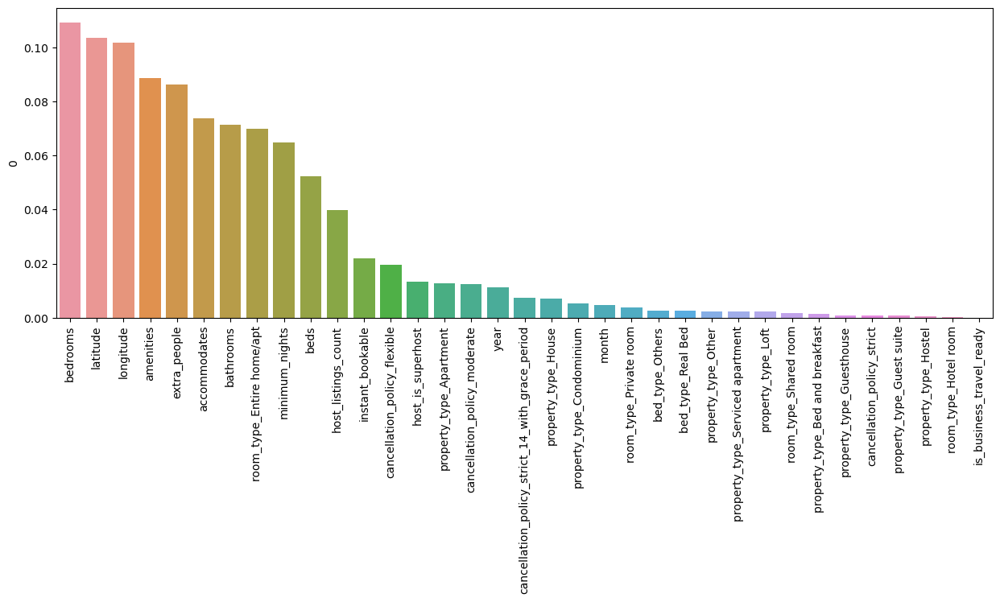

In [58]:
print(model_et.feature_importances_)
print(X_train.columns)

importance_feat = pd.DataFrame(model_et.feature_importances_, X_train.columns)
importance_feat = importance_feat.sort_values(by=0, ascending=False)
display(importance_feat)
plt.figure(figsize=(15,5))
ax = sns.barplot(x=importance_feat.index, y=importance_feat[0])
ax.tick_params(axis='x', rotation=90)

In [59]:
#  Ajustes finais do modelo 
# coluna is bussiness travel ready será excluida para análise de uma nova iteração no modelo
# Modelo ExtraTrees:
# R²:97.49%
# RSME:41.73

In [60]:
base_airbnb_ana = base_airbnb.drop(columns='is_business_travel_ready')

y = base_airbnb_ana['price']
X = base_airbnb_ana.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

model_et.fit(X_train, y_train)
pred = model_et.predict(X_test)
print(model_score('ExtraTree', y_test, pred))

Modelo ExtraTree:
R²:97.43%
RSME:42.25


In [61]:
base_airbnb_test = base_airbnb_ana.copy()
for column in base_airbnb_test:
  if 'bed_type' in column:
    base_airbnb_test = base_airbnb_test.drop(columns=column)

y = base_airbnb_test['price']
X = base_airbnb_test.drop('price', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

model_et.fit(X_train, y_train)
pred = model_et.predict(X_test)
print(model_score('ExtraTree', y_test, pred))

Modelo ExtraTree:
R²:97.42%
RSME:42.4


In [62]:
print(model_score('ExtraTrees', y_test, pred))

Modelo ExtraTrees:
R²:97.42%
RSME:42.4


#### Retirado duas informações: referente a bed_types  e is_business_travel_ready

### Deploy do projeto

#### Dar dump no modelo para recuperar depois

In [63]:
X['price'] = y
X.to_csv('new_data_airbnb.csv')

In [64]:
import joblib
joblib.dump(model_et, 'model.joblib')

['model.joblib']

In [65]:
modelo = joblib.load('model.joblib')